In [1]:
import torch
import torch.nn as nn
import scanpy as sc
import numpy as np

import slalom as sl
import h5py

In [2]:
adata = sc.read('haber_count_pr.h5ad')

In [4]:
select_genes = adata.varm['I'].sum(1)>0
adata._inplace_subset_var(select_genes)
adata.X-=adata.X.mean(0)

In [6]:
class ProxOperGroupL2:
    def __init__(self, alpha, omega, inplace=True):
    # omega - vector of coefficients with size
    # equal to the number of groups
        self._group_vect = omega*alpha
        self._inplace = inplace
    
    def __call__(self, W):        
        if not self._inplace:
            W = W.clone()
        
        norm_vect = W.norm(p=2, dim=0)
        norm_g_gr_vect = norm_vect>self._group_vect
        
        scaled_norm_vector = norm_vect/self._group_vect.view(-1)
        scaled_norm_vector+=(~(scaled_norm_vector>0)).float()
        
        W-=W/scaled_norm_vector
        W*=norm_g_gr_vect.float()
        
        return W

In [7]:
class ProxOperL1:
    def __init__(self, alpha, I, inplace=True):
        self._alpha=alpha
        self._I = ~I.bool()
        self._inplace=inplace
    
    def __call__(self, W):
        if not self._inplace:
            W = W.clone()
        
        W_geq_alpha = W>=self._alpha
        W_leq_neg_alpha = W<=-self._alpha
        
        W-=(W_geq_alpha&self._I).float()*self._alpha
        W+=(W_leq_neg_alpha&self._I).float()*self._alpha
        W-=(~W_geq_alpha&~W_leq_neg_alpha&self._I).float()*W
               
        return W

In [8]:
class AutoencoderLinearDecoder(nn.Module):
    def __init__(self, n_vars, n_terms, **kwargs):
        super().__init__()
        
        self.n_vars = n_vars
        self.n_terms = n_terms
        self.dropout_rate = kwargs.get("dropout_rate", 0.2)
        
        self.encoder = nn.Sequential(
            nn.Linear(self.n_vars, 400),
            nn.BatchNorm1d(400),
            nn.ELU(),
            nn.Dropout(self.dropout_rate),
            nn.Linear(400, 400),
            nn.BatchNorm1d(400),
            nn.ELU(),
            nn.Dropout(self.dropout_rate),
            nn.Linear(400, self.n_terms)
        )
        
        self.decoder = nn.Linear(self.n_terms, self.n_vars, bias=False)
        
        self.decoder.weight.data.normal_()
        self.decoder.weight.data/=self.n_terms**0.5
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        
        return encoded, decoded      

In [9]:
def train_autoencoder(adata, autoencoder, l2_reg_alpha, lr, batch_size, num_epochs, prox_operator):
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=lr)
    #optimizer = torch.optim.SGD(autoencoder.parameters(), lr=lr)
    
    t_X = torch.from_numpy(adata.X)
    n_obs = adata.n_obs
    
    zeros = torch.zeros((batch_size, autoencoder.n_terms))
    
    l2_loss = nn.MSELoss(reduction='sum')
    
    for epoch in range(num_epochs):
        autoencoder.train()
        
        for step in range(int(adata.n_obs/batch_size)):
            X = torch.from_numpy(adata.chunk_X(batch_size))
            
            encoded, decoded = autoencoder(X)
            
            loss = (l2_loss(decoded, X)+l2_reg_alpha*l2_loss(encoded, zeros))/batch_size
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            prox_operator(autoencoder.decoder.weight.data)
            
            if step % 100 == 0: 
                print('Epoch:', epoch, '| batch train loss: %.4f' % loss.data.numpy())
                
        #prox_operator(autoencoder.decoder.weight.data)
        
        autoencoder.eval()
        t_encoded, t_decoded = autoencoder(t_X)
        
        t_reconst = l2_loss(t_decoded, t_X).data.numpy()/n_obs
        t_regul = l2_reg_alpha*l2_loss(t_encoded, torch.zeros_like(t_encoded)).data.numpy()/n_obs
        t_loss = t_reconst + l2_reg_alpha*t_regul
        
        print('Epoch:', epoch, '-- total train loss: %.4f=%.4f+%.4f' % (t_loss, t_reconst, t_regul))
        
        n_deact_terms = (~(autoencoder.decoder.weight.data.norm(p=2, dim=0)>0)).float().sum().numpy()
        print('Number of deactivated terms:', int(n_deact_terms))
        
        n_deact_genes = (~(autoencoder.decoder.weight.data>0)).float().sum().numpy()
        print('Number of deactivated genes:', int(n_deact_genes))

In [133]:
autoencoder = AutoencoderLinearDecoder(adata.n_vars, len(adata.uns['terms']))

In [134]:
LR = 0.001
BATCH_SIZE = 62
N_EPOCHS = 50

ALPHA0 = 0.1

ALPHA1 = 1.05*LR #0.36 #0.4 #0.45 #0.95
ALPHA2 = 0.55*LR #0.78 #0.74 #0.71 #0.55
I = torch.from_numpy(adata.varm['I'])
#OMEGA = I.sum(0).float().sqrt()
OMEGA = torch.ones(len(adata.uns['terms']))

In [135]:
prox_op_l1 = ProxOperL1(ALPHA1, I)
prox_op_group = ProxOperGroupL2(ALPHA2, OMEGA)

prox_operator = lambda W: prox_op_group(prox_op_l1(W))

In [136]:
train_autoencoder(adata, autoencoder, ALPHA0, LR, BATCH_SIZE, N_EPOCHS, prox_operator)

Epoch: 0 | batch train loss: 1588.1613
Epoch: 0 | batch train loss: 356.3224
Epoch: 0 -- total train loss: 341.0706=340.0757+9.9488
Number of deactivated terms: 0
Number of deactivated genes: 1948913
Epoch: 1 | batch train loss: 357.8369
Epoch: 1 | batch train loss: 325.8603
Epoch: 1 -- total train loss: 327.9043=327.0021+9.0217
Number of deactivated terms: 17
Number of deactivated genes: 1953344
Epoch: 2 | batch train loss: 347.2205
Epoch: 2 | batch train loss: 334.3695
Epoch: 2 -- total train loss: 322.0926=321.1821+9.1049
Number of deactivated terms: 55
Number of deactivated genes: 1954053
Epoch: 3 | batch train loss: 344.3183
Epoch: 3 | batch train loss: 317.9314
Epoch: 3 -- total train loss: 314.9102=313.9544+9.5584
Number of deactivated terms: 61
Number of deactivated genes: 1954101
Epoch: 4 | batch train loss: 324.8980
Epoch: 4 | batch train loss: 332.4843
Epoch: 4 -- total train loss: 310.5813=309.6038+9.7751
Number of deactivated terms: 44
Number of deactivated genes: 1954963


Epoch: 40 -- total train loss: 273.2635=272.7146+5.4881
Number of deactivated terms: 292
Number of deactivated genes: 1960084
Epoch: 41 | batch train loss: 291.5259
Epoch: 41 | batch train loss: 296.7858
Epoch: 41 -- total train loss: 272.9197=272.3694+5.5028
Number of deactivated terms: 293
Number of deactivated genes: 1960263
Epoch: 42 | batch train loss: 317.1384
Epoch: 42 | batch train loss: 278.0042
Epoch: 42 -- total train loss: 273.3216=272.7839+5.3771
Number of deactivated terms: 293
Number of deactivated genes: 1960545
Epoch: 43 | batch train loss: 294.4672
Epoch: 43 | batch train loss: 304.3412
Epoch: 43 -- total train loss: 273.2641=272.7265+5.3761
Number of deactivated terms: 293
Number of deactivated genes: 1960109
Epoch: 44 | batch train loss: 276.7558
Epoch: 44 | batch train loss: 294.5349
Epoch: 44 -- total train loss: 273.0125=272.4831+5.2934
Number of deactivated terms: 293
Number of deactivated genes: 1960366
Epoch: 45 | batch train loss: 291.7154
Epoch: 45 | batch t

In [137]:
autoencoder.decoder.weight.data.norm(p=2, dim=0)

tensor([0.0000, 2.0487, 0.0000, 0.0000, 1.3356, 0.0000, 1.1014, 0.0000, 1.1131,
        0.0000, 0.0000, 0.0000, 1.0856, 1.2098, 0.7049, 1.0764, 0.0000, 1.2490,
        0.0000, 1.1765, 0.0000, 1.3758, 0.0000, 0.0000, 0.0000, 2.8114, 0.0000,
        1.2919, 0.0000, 0.0000, 1.4251, 1.1917, 0.9145, 0.0000, 0.0000, 0.0000,
        1.5706, 0.0000, 1.3215, 0.0000, 0.0000, 1.6131, 1.2780, 0.0000, 2.2317,
        0.0000, 1.1003, 1.2212, 1.0657, 0.0000, 1.1623, 1.1531, 0.0000, 0.0000,
        1.2864, 1.3519, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 1.1026, 0.0000,
        0.0000, 0.0000, 1.3134, 0.0000, 0.0000, 1.1001, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 1.2287, 1.2183, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        1.0791, 0.0000, 0.0000, 1.1581, 0.0000, 1.0924, 1.2272, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.5606, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 1.2108, 1.1631, 0.0000, 0.0000, 1.1161, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 

In [165]:
rel = autoencoder.decoder.weight.data.norm(p=2, dim=0).data.numpy()
idx = np.argsort(-rel)
adata.uns['terms'][idx][:70]

array(['TCA_CYCLE_AND_RESPIRATORY_ELEC', 'METABOLISM_OF_PROTEINS',
       'CELL_CYCLE', 'METABOLISM_OF_LIPIDS_AND_LIPOP', 'IMMUNE_SYSTEM',
       'METABOLISM_OF_RNA', 'TRANSLATION', 'BIOLOGICAL_OXIDATIONS',
       'RESPIRATORY_ELECTRON_TRANSPORT', 'ASTROCYTES',
       'METABOLISM_OF_CARBOHYDRATES', 'PEPTIDE_CHAIN_ELONGATION',
       'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'MRNA_PROCESSING',
       'METABOLISM_OF_AMINO_ACIDS_AND_', 'CELL_CYCLE_MITOTIC',
       'TRANSCRIPTION', 'HEMOSTASIS', 'METABOLISM_OF_VITAMINS_AND_COF',
       'APOPTOSIS', 'METABOLISM_OF_NUCLEOTIDES', 'MEMBRANE_TRAFFICKING',
       'AXON_GUIDANCE', 'FATTY_ACID_TRIACYLGLYCEROL_AND',
       'NONSENSE_MEDIATED_DECAY_ENHANC', 'TRNA_AMINOACYLATION',
       '3_UTR_MEDIATED_TRANSLATIONAL_R', 'MRNA_SPLICING',
       'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'GLUCOSE_METABOLISM',
       'INTEGRATION_OF_ENERGY_METABOLI', 'INFLUENZA_VIRAL_RNA_TRANSCRIPT',
       'INFLUENZA_LIFE_CYCLE', 'ADAPTIVE_IMMUNE_SYSTEM',
       'SYNTHESIS_AND_INTERCO

In [139]:
def select_terms(first, second):
    f = np.where(adata.uns['terms']==first)[0][0]
    s = np.where(adata.uns['terms']==second)[0][0]
    return f, s

In [184]:
terms = select_terms('ANTIGEN_PROCESSING_UBIQUITINAT', 'TCA_CYCLE_AND_RESPIRATORY_ELEC')

In [185]:
W = autoencoder.decoder.weight.data.numpy()
(np.abs(W[:, terms])>0).sum(0)

array([220, 115])

In [186]:
autoencoder.decoder.weight.data.norm(p=2, dim=0)[list(terms)]

tensor([1.3586, 2.8114])

In [187]:
adata.varm['I'][:, terms].sum(0)

array([185, 110])

In [188]:
encoded, decoded = autoencoder(torch.from_numpy(adata.X))
vars_latent = encoded[:, terms].data.numpy()

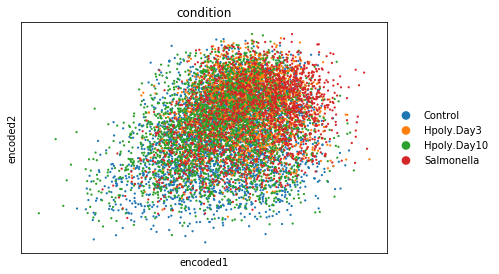

In [189]:
adata.obsm['X_encoded'] = vars_latent
sc.pl.scatter(adata, basis='encoded', color='condition', size=20)

TCA_CYCLE_AND_RESPIRATORY_ELEC


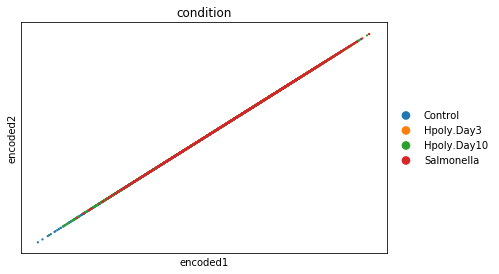

METABOLISM_OF_PROTEINS


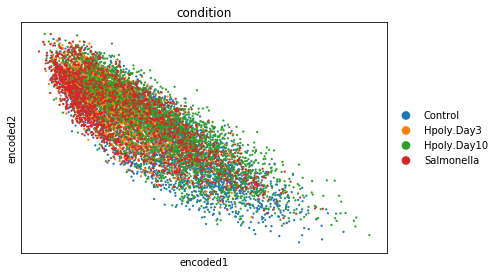

CELL_CYCLE


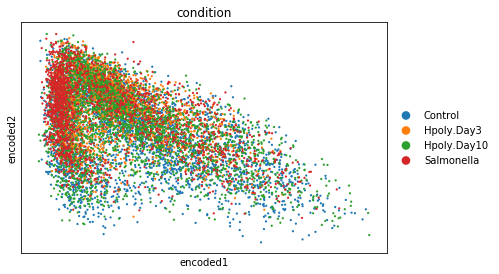

METABOLISM_OF_LIPIDS_AND_LIPOP


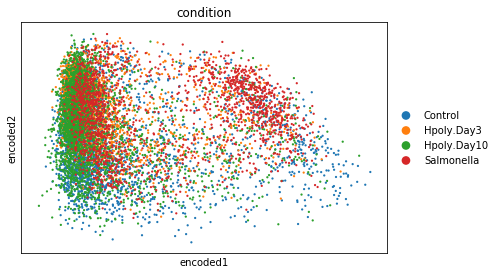

IMMUNE_SYSTEM


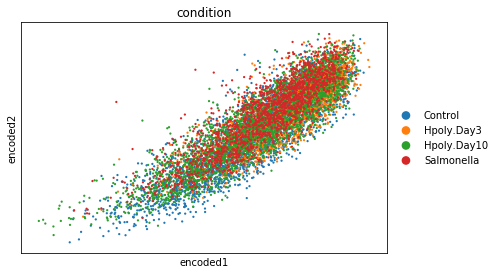

METABOLISM_OF_RNA


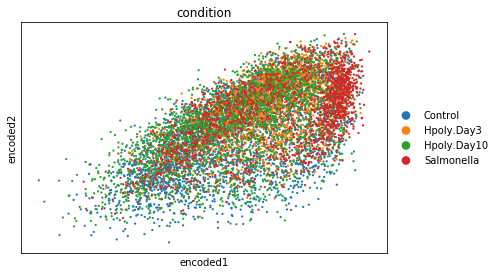

TRANSLATION


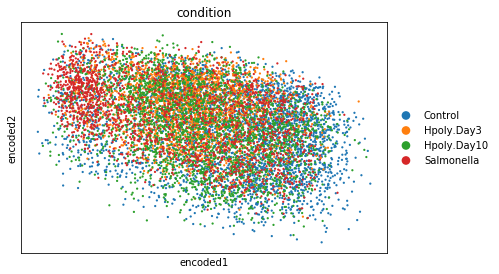

BIOLOGICAL_OXIDATIONS


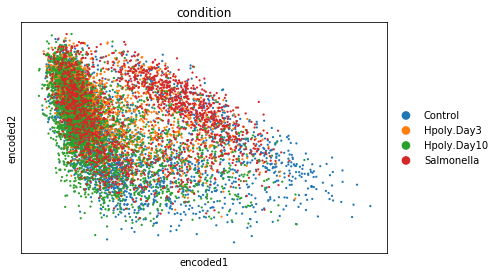

RESPIRATORY_ELECTRON_TRANSPORT


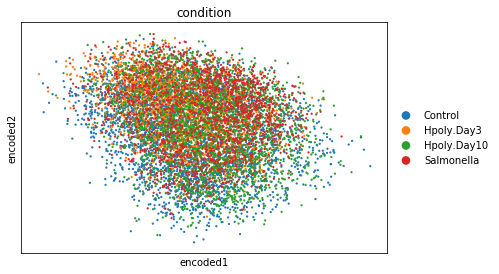

ASTROCYTES


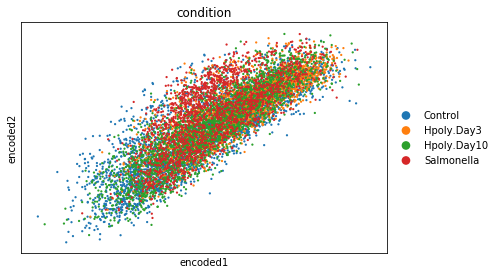

METABOLISM_OF_CARBOHYDRATES


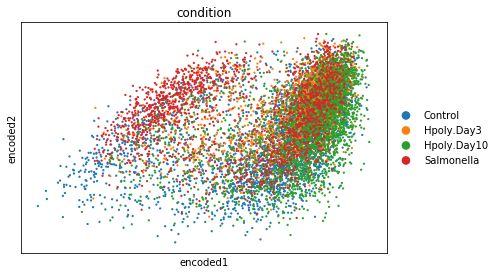

PEPTIDE_CHAIN_ELONGATION


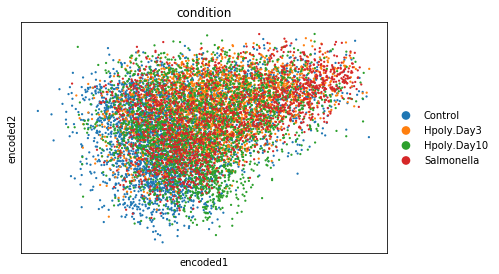

TRANSMEMBRANE_TRANSPORT_OF_SMA


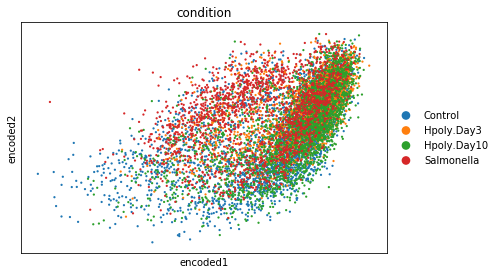

MRNA_PROCESSING


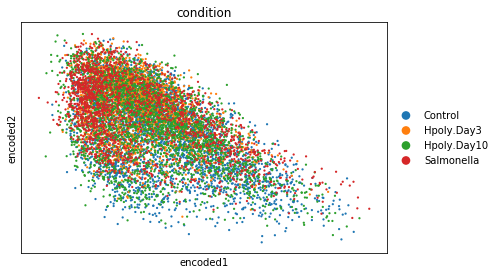

METABOLISM_OF_AMINO_ACIDS_AND_


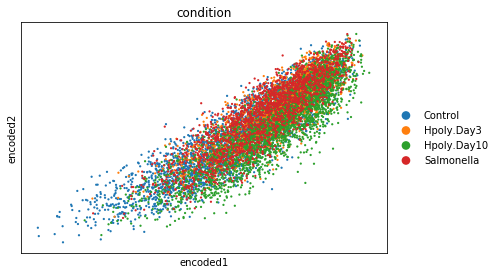

CELL_CYCLE_MITOTIC


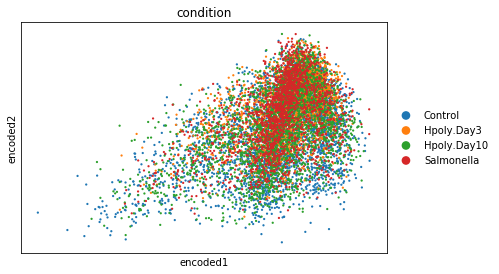

TRANSCRIPTION


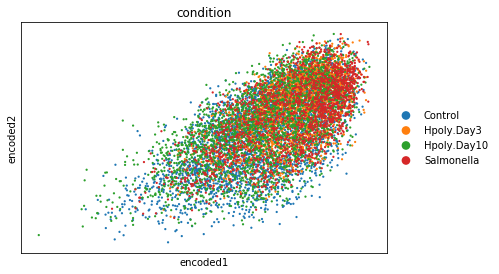

HEMOSTASIS


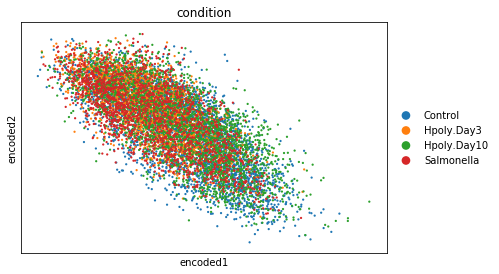

METABOLISM_OF_VITAMINS_AND_COF


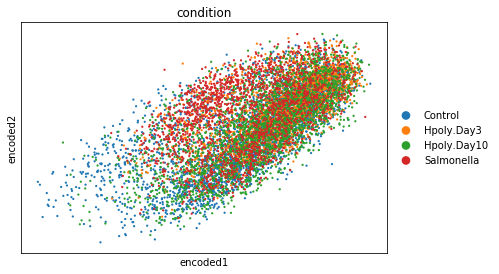

APOPTOSIS


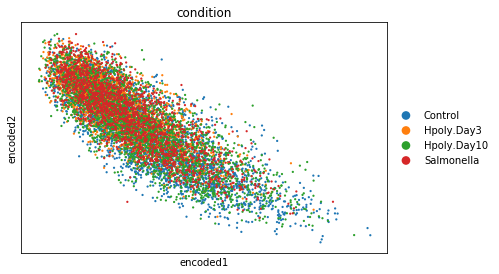

METABOLISM_OF_NUCLEOTIDES


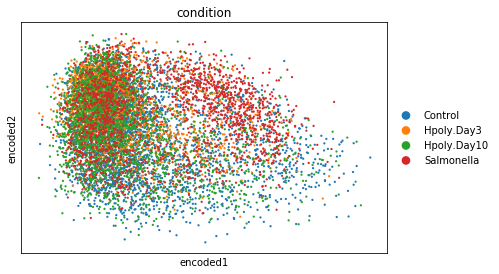

MEMBRANE_TRAFFICKING


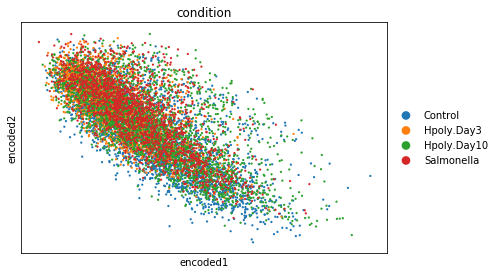

AXON_GUIDANCE


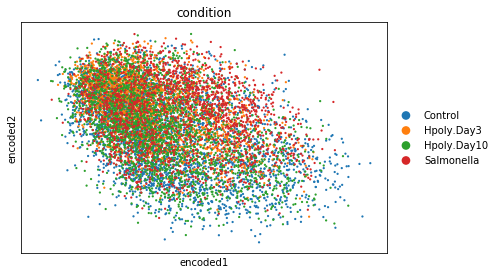

FATTY_ACID_TRIACYLGLYCEROL_AND


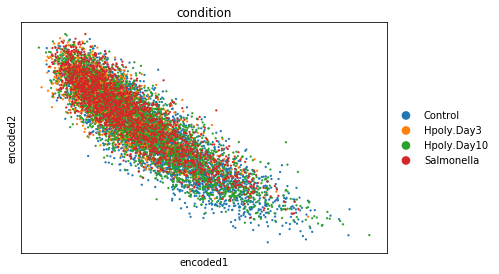

NONSENSE_MEDIATED_DECAY_ENHANC


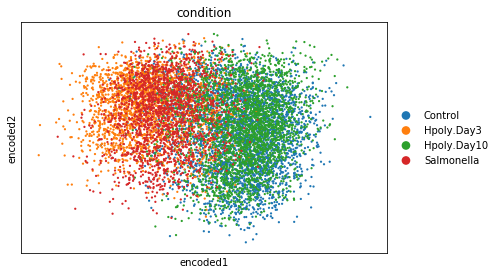

TRNA_AMINOACYLATION


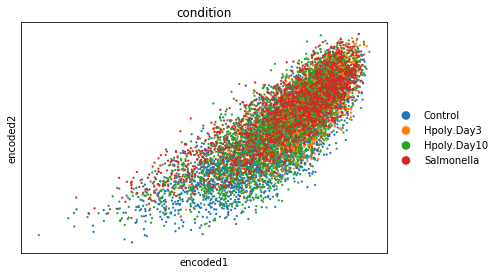

3_UTR_MEDIATED_TRANSLATIONAL_R


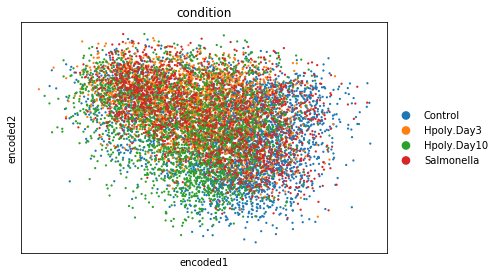

MRNA_SPLICING


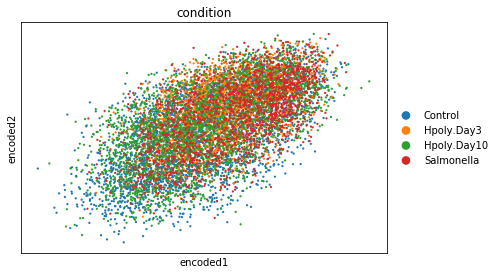

CYTOKINE_SIGNALING_IN_IMMUNE_S


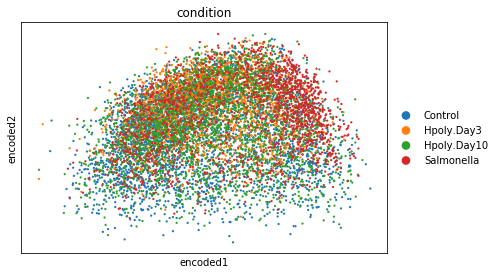

GLUCOSE_METABOLISM


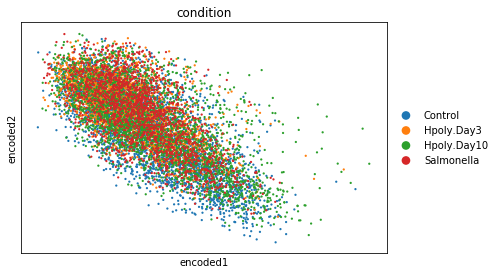

INTEGRATION_OF_ENERGY_METABOLI


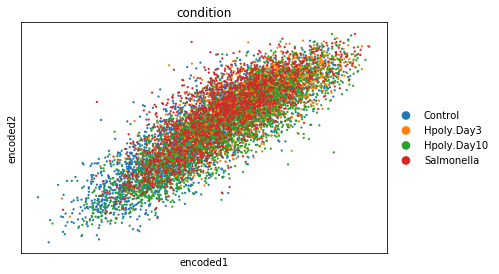

INFLUENZA_VIRAL_RNA_TRANSCRIPT


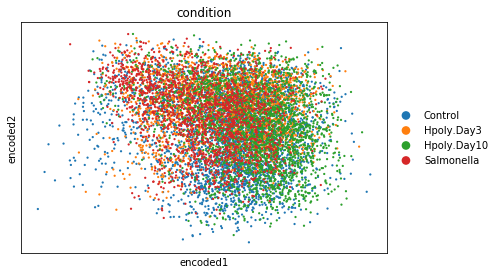

INFLUENZA_LIFE_CYCLE


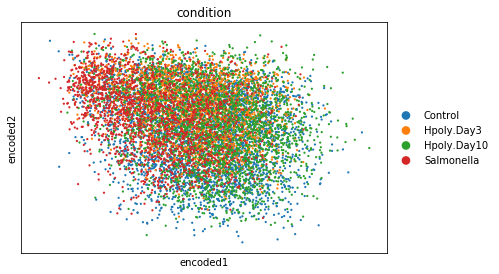

ADAPTIVE_IMMUNE_SYSTEM


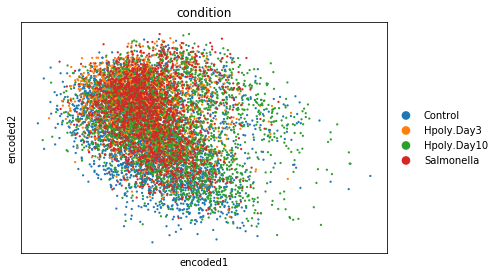

SYNTHESIS_AND_INTERCONVERSION_


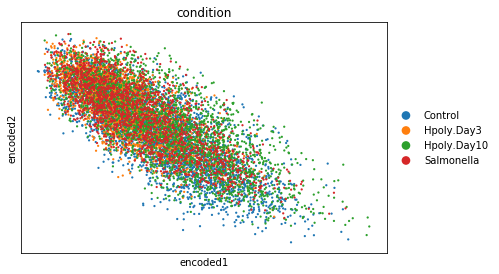

PROCESSING_OF_CAPPED_INTRON_CO


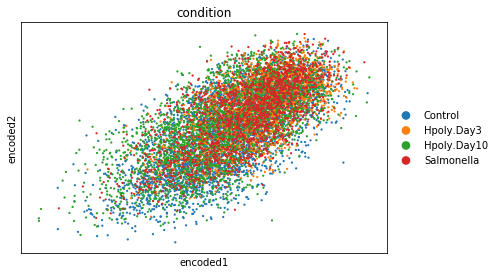

POST_TRANSLATIONAL_PROTEIN_MOD


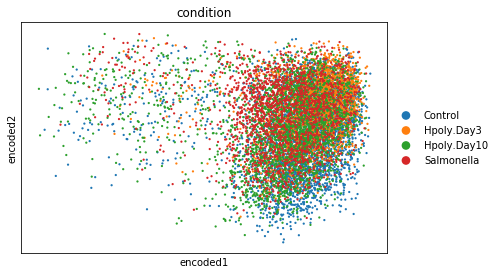

UNFOLDED_PROTEIN_RESPONSE


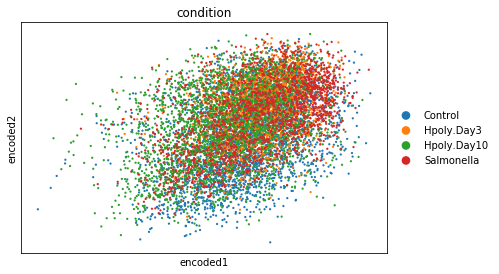

DIABETES_PATHWAYS


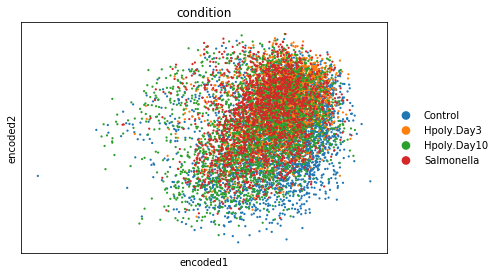

CELL_CELL_COMMUNICATION


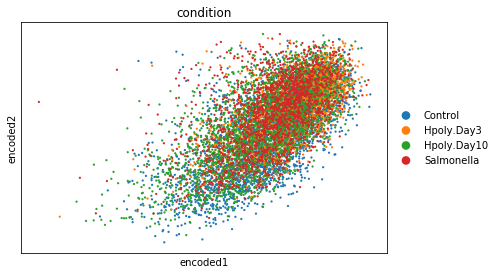

PROTEIN_FOLDING


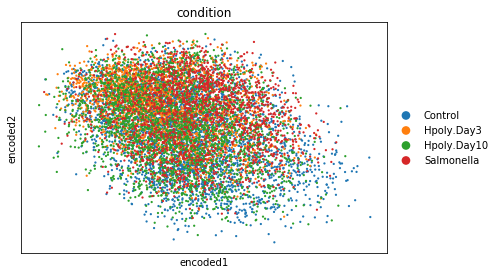

GPCR_DOWNSTREAM_SIGNALING


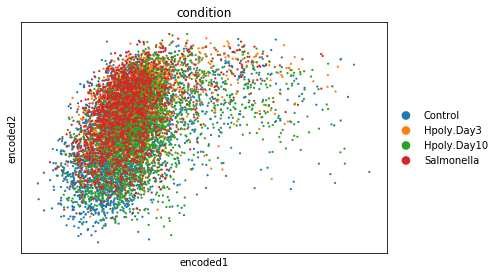

PURINE_METABOLISM


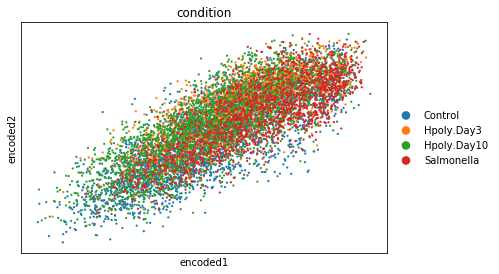

APOPTOTIC_EXECUTION_PHASE


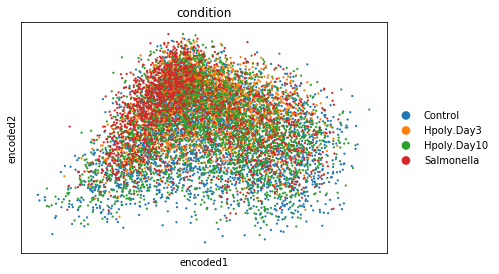

HIV_INFECTION


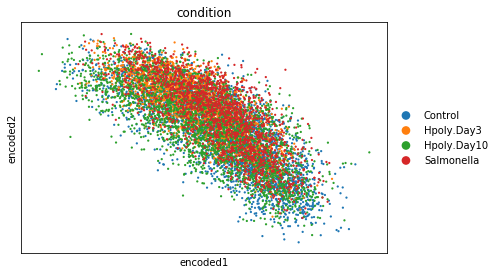

MITOTIC_G2_G2_M_PHASES


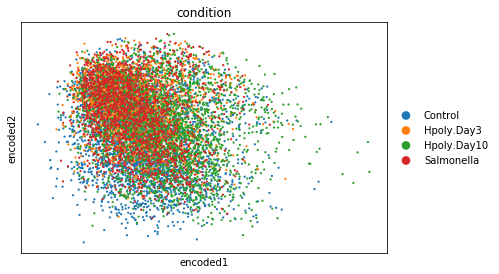

DEVELOPMENTAL_BIOLOGY


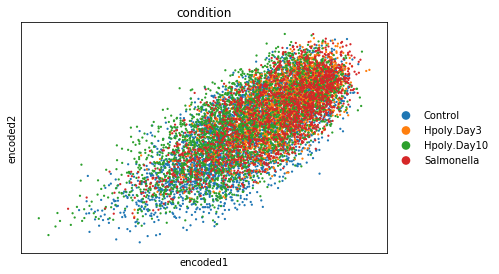

RESPIRATORY_ELECTRON_TRANSPORT


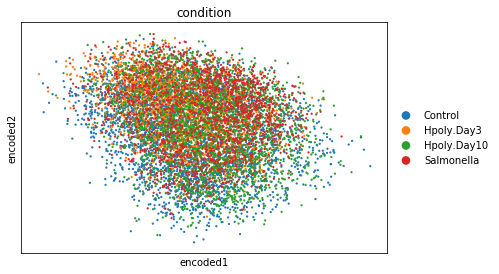

INNATE_IMMUNE_SYSTEM


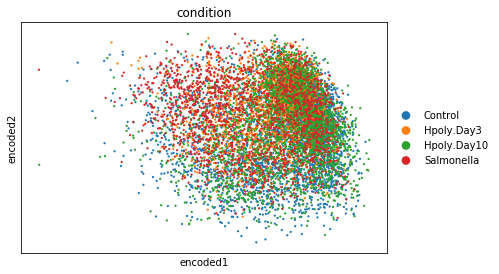

LATE_PHASE_OF_HIV_LIFE_CYCLE


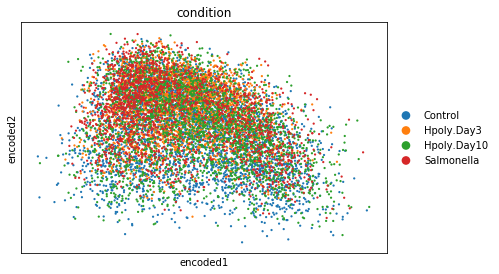

PLATELET_ACTIVATION_SIGNALING_


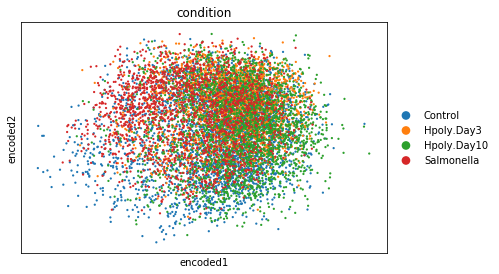

ANTIGEN_PROCESSING_UBIQUITINAT


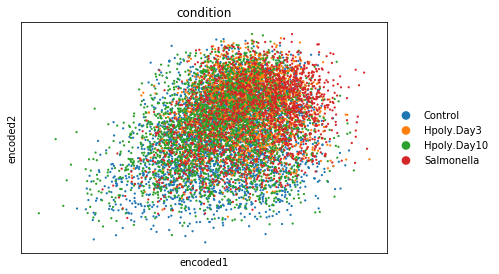

RESPONSE_TO_ELEVATED_PLATELET_


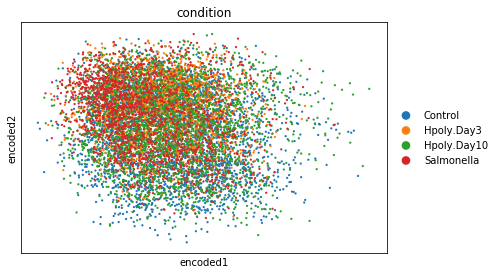

HOST_INTERACTIONS_OF_HIV_FACTO


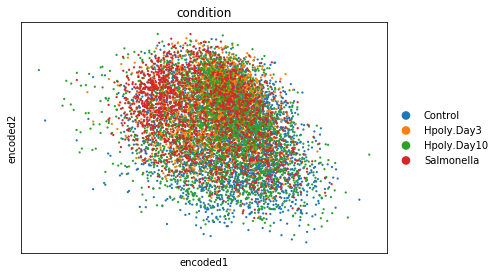

SRP_DEPENDENT_COTRANSLATIONAL_


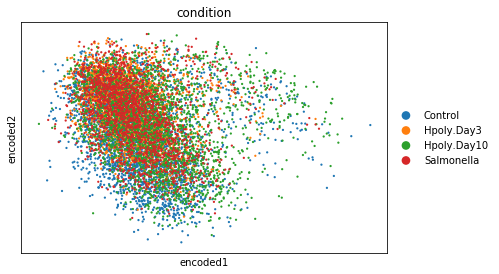

SIGNALING_BY_GPCR


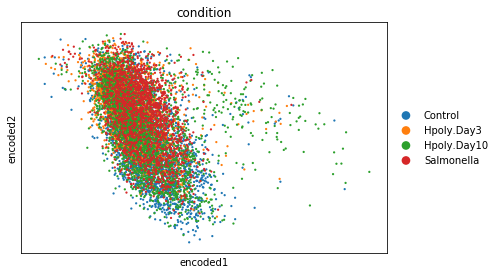

PYRUVATE_METABOLISM_AND_CITRIC


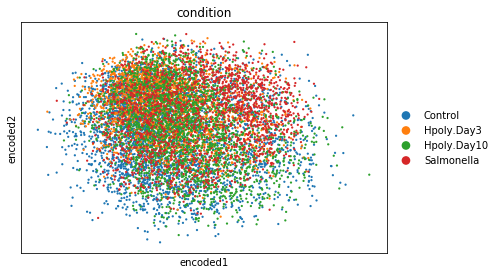

MHC_CLASS_II_ANTIGEN_PRESENTAT


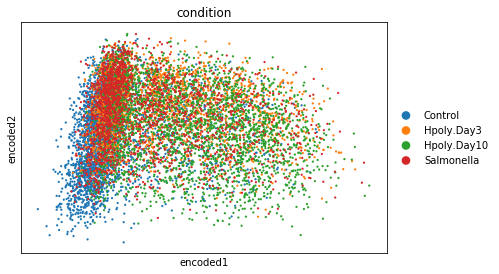

SPHINGOLIPID_METABOLISM


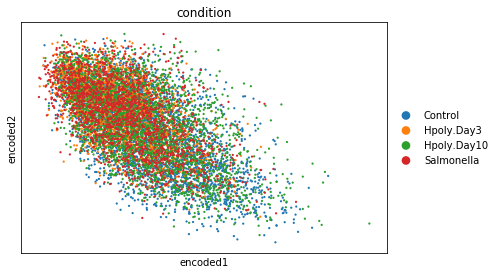

HIV_LIFE_CYCLE


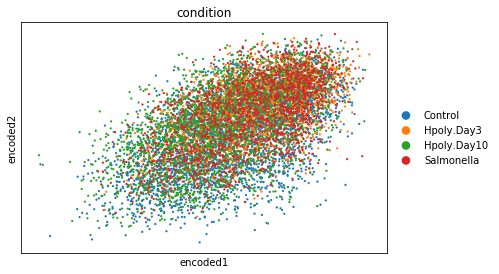

SLC_MEDIATED_TRANSMEMBRANE_TRA


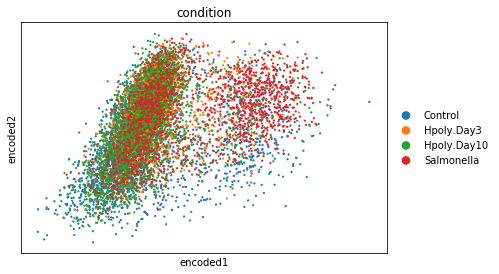

IMMUNOREGULATORY_INTERACTIONS_


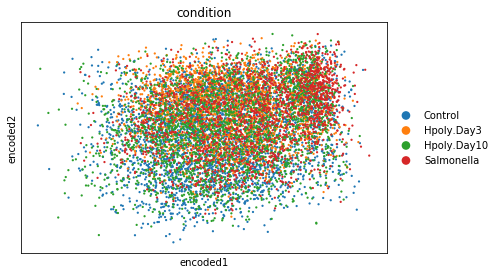

GLUTATHIONE_CONJUGATION


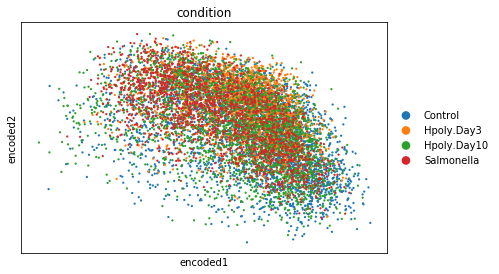

GLYCEROPHOSPHOLIPID_BIOSYNTHES


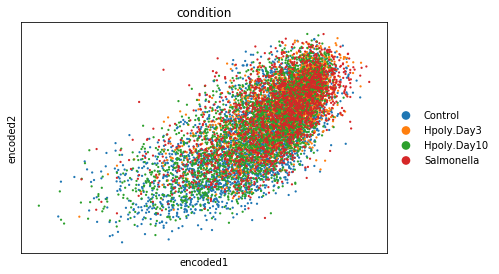

CELL_CELL_JUNCTION_ORGANIZATIO


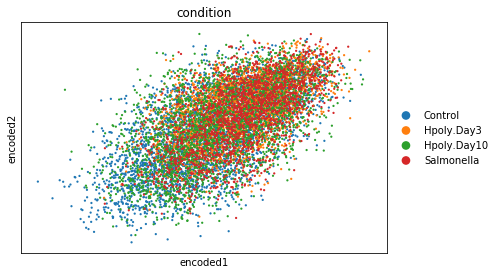

MITOCHONDRIAL_PROTEIN_IMPORT


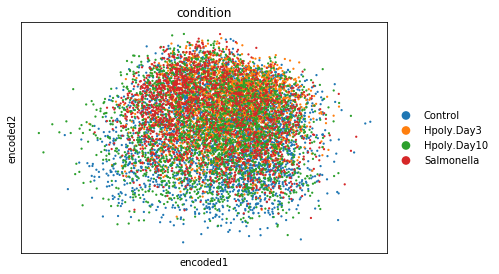

SIGNALING_BY_TGF_BETA_RECEPTOR


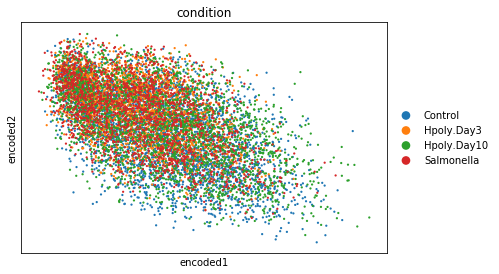

NEURONAL_SYSTEM


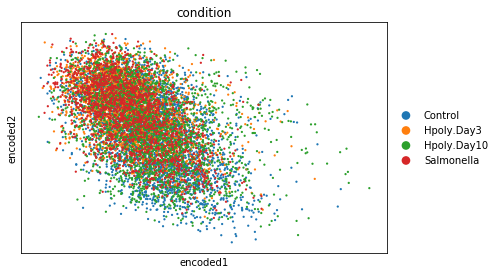

METABOLISM_OF_MRNA


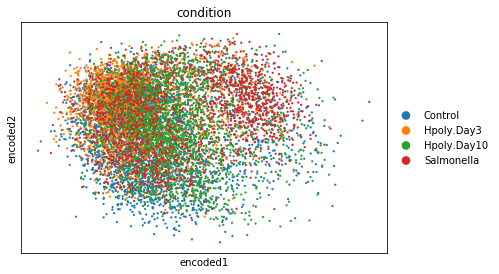

ASPARAGINE_N_LINKED_GLYCOSYLAT


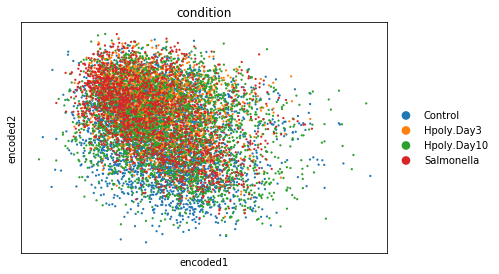

OPIOID_SIGNALLING


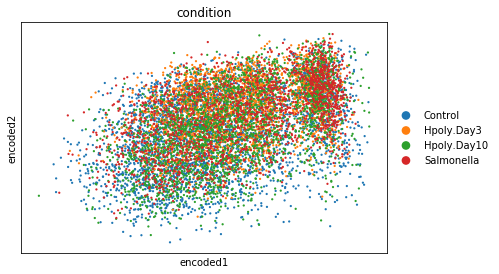

ANTIGEN_PROCESSING_CROSS_PRESE


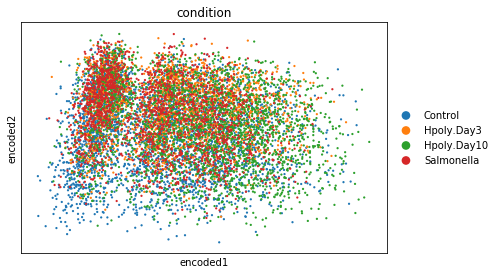

ACTIVATION_OF_CHAPERONE_GENES_


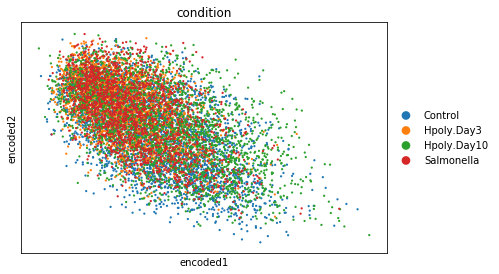

SIGNALING_BY_EGFR_IN_CANCER


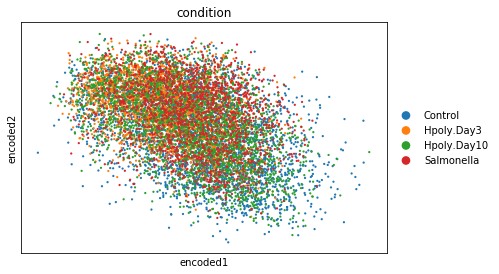

TRANS_GOLGI_NETWORK_VESICLE_BU


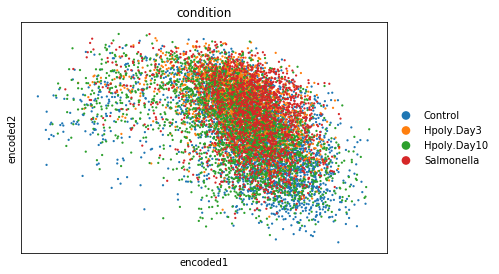

PREFOLDIN_MEDIATED_TRANSFER_OF


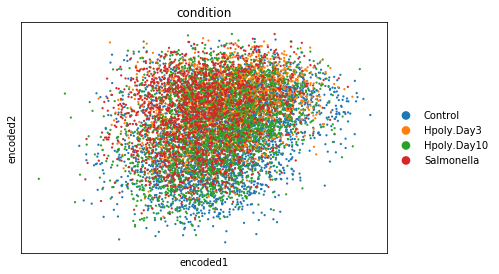

RNA_POL_I_TRANSCRIPTION


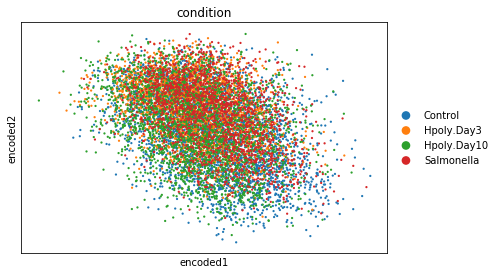

ION_CHANNEL_TRANSPORT


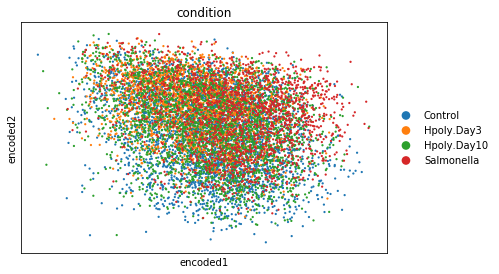

INTERFERON_SIGNALING


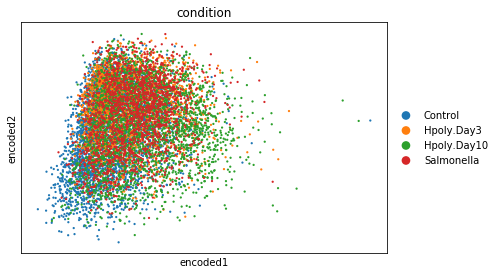

INTERFERON_ALPHA_BETA_SIGNALIN


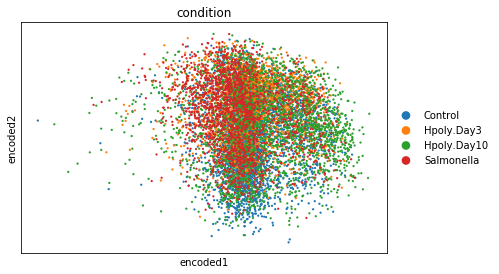

RNA_POL_I_RNA_POL_III_AND_MITO


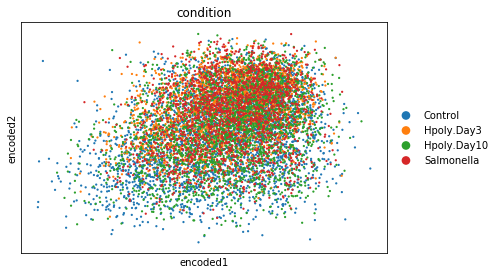

TIGHT_JUNCTION_INTERACTIONS


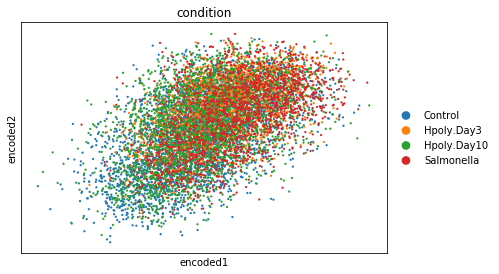

SIGNALLING_BY_NGF


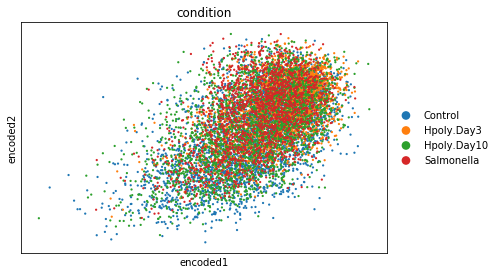

POST_CHAPERONIN_TUBULIN_FOLDIN


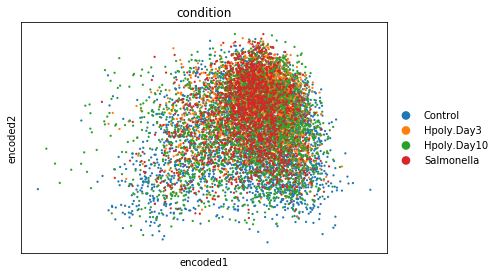

MITOTIC_M_M_G1_PHASES


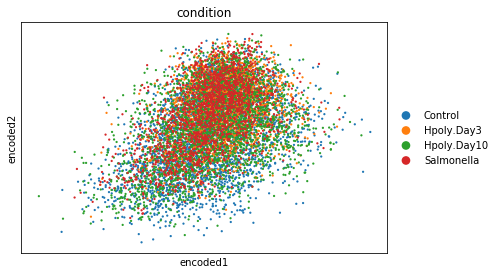

AMINO_ACID_SYNTHESIS_AND_INTER


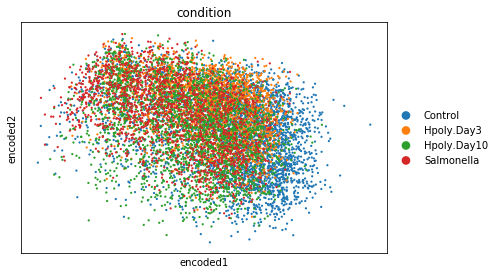

G_ALPHA_I_SIGNALLING_EVENTS


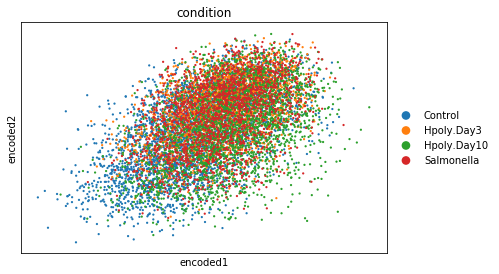

IRON_UPTAKE_AND_TRANSPORT


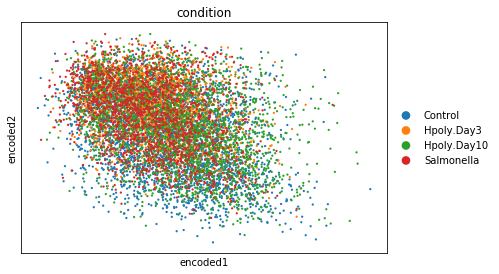

SIGNALING_BY_INSULIN_RECEPTOR


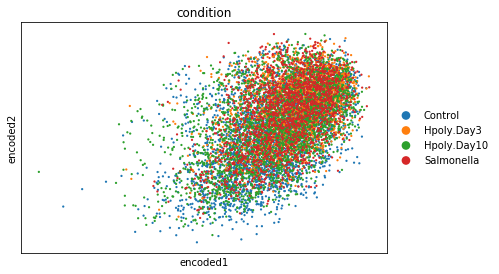

PHASE_II_CONJUGATION


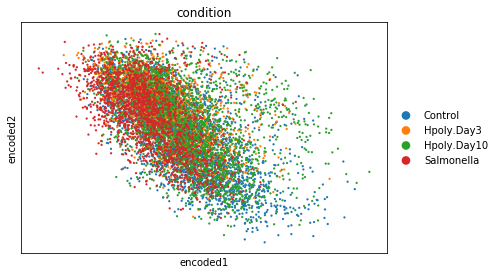

LIPOPROTEIN_METABOLISM


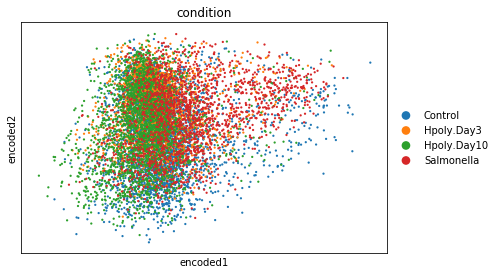

SIGNALING_BY_THE_B_CELL_RECEPT


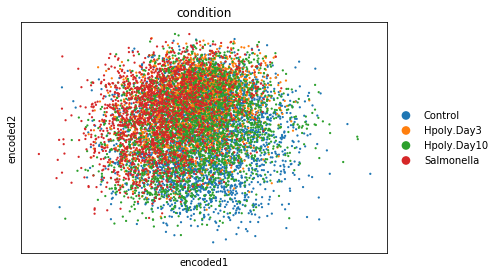

NGF_SIGNALLING_VIA_TRKA_FROM_T


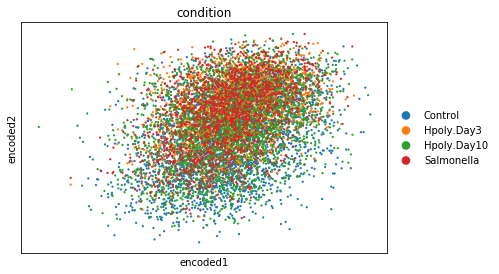

GLUCONEOGENESIS


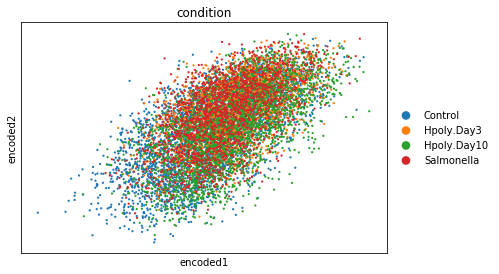

PYRIMIDINE_METABOLISM


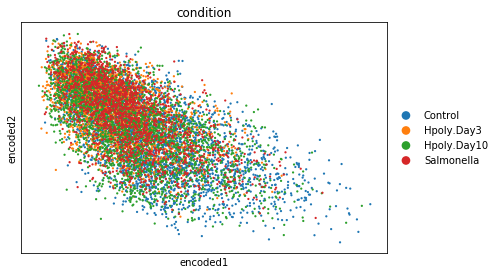

O_LINKED_GLYCOSYLATION_OF_MUCI


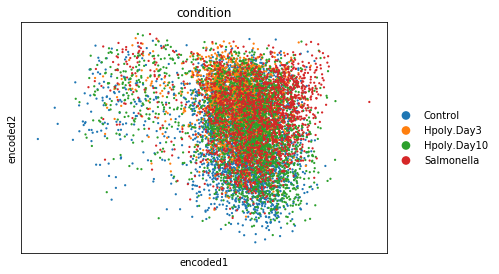

DNA_REPAIR


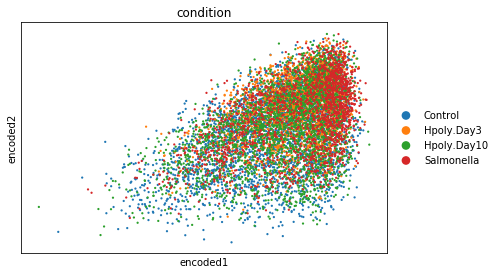

EXTRACELLULAR_MATRIX_ORGANIZAT


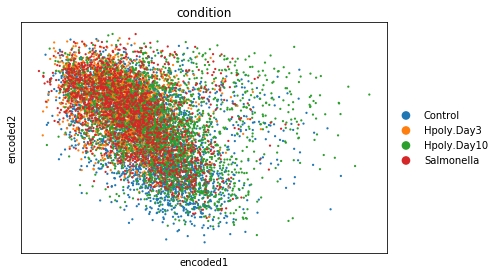

INFLAMMASOMES


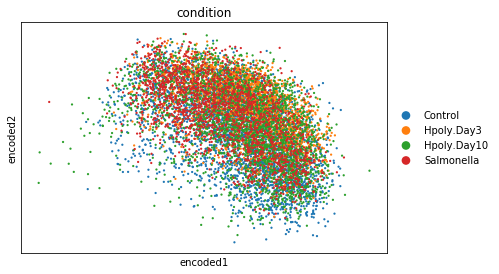

TGF_BETA_RECEPTOR_SIGNALING_AC


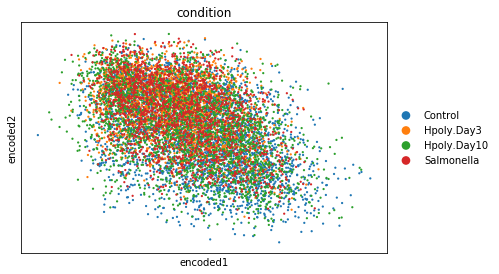

In [192]:
for t in adata.uns['terms'][idx][:100]:
    terms = select_terms(t, 'TCA_CYCLE_AND_RESPIRATORY_ELEC')
    vars_latent = encoded[:, terms].data.numpy()
    adata.obsm['X_encoded'] = vars_latent
    print(t)
    sc.pl.scatter(adata, basis='encoded', color='condition', size=20)